In [11]:
import tensorflow as tf
from tensorflow.keras.layers import Dense,Flatten
from tensorflow.keras import Input

In [12]:
dataset = tf.keras.preprocessing.image_dataset_from_directory("/content/drive/MyDrive/homer_bart",image_size=(64, 64),label_mode = "binary")

Found 269 files belonging to 2 classes.


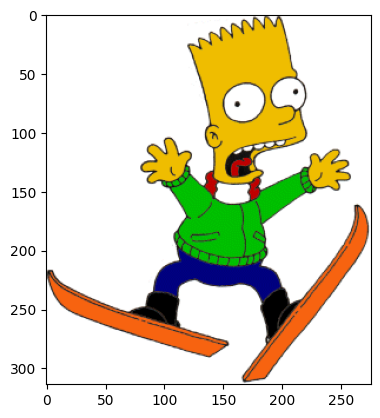

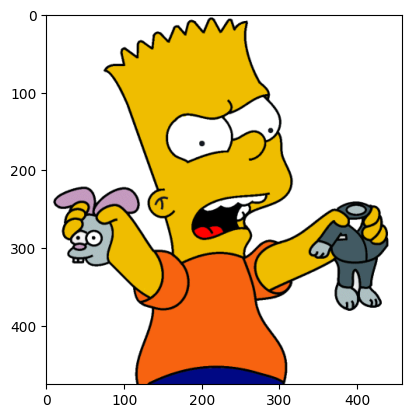

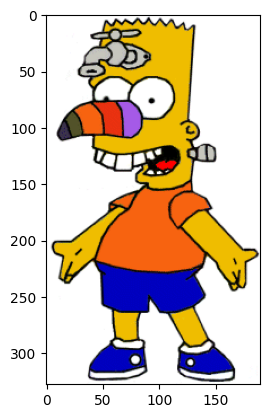

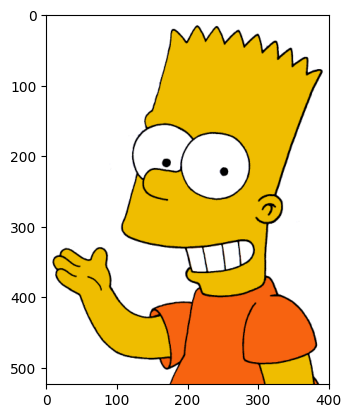

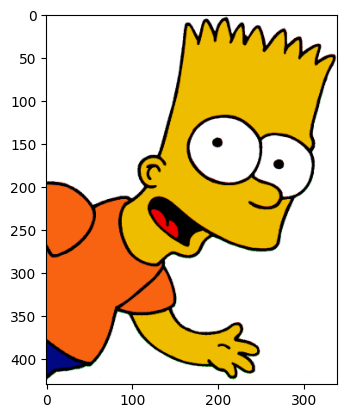

...

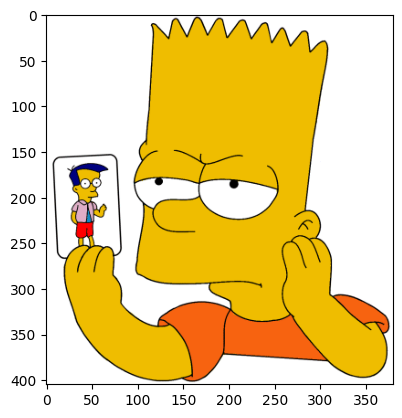

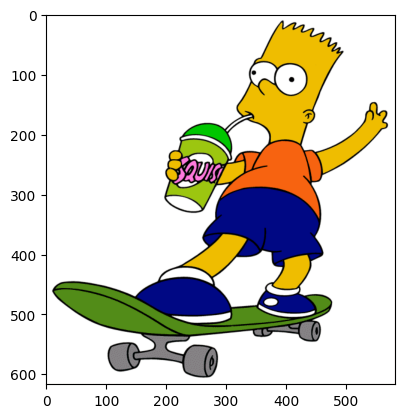

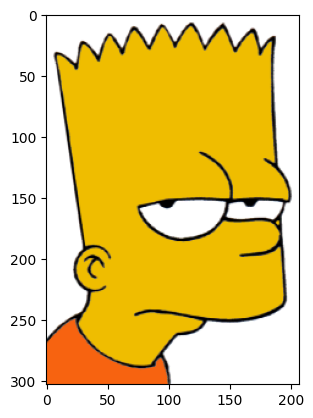

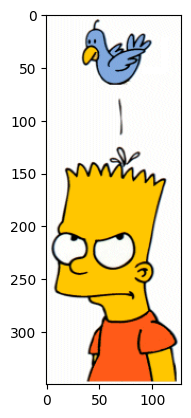

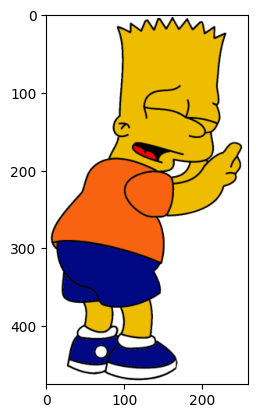

In [13]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

bart_folder_path = "/content/drive/MyDrive/homer_bart/Bart"
bart_folder = os.listdir(bart_folder_path)
for file in bart_folder:
  img = mpimg.imread(os.path.join(bart_folder_path,file))
  plt.imshow(img)
  plt.show()

In [14]:
train_data = dataset.take(8)
test_data = dataset.skip(8)
train_data = train_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_data = test_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [15]:
preprocess = tf.keras.Sequential(
    [tf.keras.layers.Rescaling(1.0/255)]
)
model = tf.keras.Sequential()
model.add(Input((64,64,3)))
model.add(Flatten())
model.add(preprocess)
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [16]:
model.compile(optimizer='adam',
              loss = tf.keras.losses.BinaryCrossentropy(from_logits=False),
              metrics = ['accuracy'])

In [17]:
model.fit(train_data,
          epochs = 16,
          batch_size = 16,
          verbose=1,
          validation_data = test_data)

Epoch 1/16
8/8 [==============================] - 5s 409ms/step - loss: 1.9688 - accuracy: 0.5234 - val_loss: 1.8933 - val_accuracy: 0.2308
Epoch 2/16
8/8 [==============================] - 0s 24ms/step - loss: 0.9670 - accuracy: 0.5469 - val_loss: 0.5872 - val_accuracy: 0.7692
Epoch 3/16
8/8 [==============================] - 0s 22ms/step - loss: 0.7126 - accuracy: 0.6641 - val_loss: 0.8248 - val_accuracy: 0.7692
Epoch 4/16
8/8 [==============================] - 0s 25ms/step - loss: 0.8362 - accuracy: 0.6523 - val_loss: 0.8656 - val_accuracy: 0.7692
Epoch 5/16
8/8 [==============================] - 0s 23ms/step - loss: 0.9003 - accuracy: 0.5898 - val_loss: 0.5874 - val_accuracy: 0.7692
Epoch 6/16
8/8 [==============================] - 0s 28ms/step - loss: 0.8808 - accuracy: 0.5938 - val_loss: 0.6736 - val_accuracy: 0.7692
Epoch 7/16
8/8 [==============================] - 0s 23ms/step - loss: 0.5789 - accuracy: 0.7422 - val_loss: 0.3818 - val_accuracy: 0.7692
Epoch 8/16
8/8 [==========

In [18]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 12288)             0         
                                                                 
 sequential_2 (Sequential)   (None, 12288)             0         
                                                                 
 dense_4 (Dense)             (None, 128)               1572992   
                                                                 
 dense_5 (Dense)             (None, 64)                8256      
                                                                 
 dense_6 (Dense)             (None, 32)                2080      
                                                                 
 dense_7 (Dense)             (None, 1)                 33        
                                                                 
Total params: 1583361 (6.04 MB)
Trainable params: 1583

In [19]:
test_loss, test_accuracy = model.evaluate(test_data)
print('Test Loss:', test_loss)
print('Test Accuracy:', test_accuracy)

1/1 [==============================] - 0s 15ms/step - loss: 0.2762 - accuracy: 1.0000
Test Loss: 0.2762320935726166
Test Accuracy: 1.0
